# Import library

In [1]:
import numpy as np 
import pandas as pd 
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
from fcmeans import FCM
from sklearn.metrics import silhouette_score

In [2]:
ord_dt = pd.read_csv('Olist/Order Detail.csv')
ord_stt = pd.read_csv('Olist/Order Status.csv')
cus = pd.read_csv('Olist/Customers.csv')
pay = pd.read_csv('Olist/Payment.csv')

In [3]:
df = ord_dt\
.merge(ord_stt, on = 'order_id', how = 'inner')\
.merge(pay, on = 'order_id', how = 'inner')\
.merge(cus, on = 'customer_id', how = 'inner')
df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,shipping_cost,customer_id,order_status,order_purchase_timestamp,...,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,9/19/2017 9:45,58.90,13.29,3ce436f183e68e07877b285a838db11a,delivered,9/13/2017 8:59,...,9/20/2017 23:43,9/29/2017 0:00,1,credit_card,2,72.19,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,5/3/2017 11:05,239.90,19.93,f6dd3ec061db4e3987629fe6b26e5cce,delivered,4/26/2017 10:53,...,5/12/2017 16:04,5/15/2017 0:00,1,credit_card,3,259.83,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,SP
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,1/18/2018 14:48,199.00,17.87,6489ae5e4333f3693df5ad4372dab6d3,delivered,1/14/2018 14:33,...,1/22/2018 13:19,2/5/2018 0:00,1,credit_card,5,216.87,3818d81c6709e39d06b2738a8d3a2474,35661,para de minas,MG
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,8/15/2018 10:10,12.99,12.79,d4eb9395c8c0431ee92fce09860c5a06,delivered,8/8/2018 10:00,...,8/14/2018 13:32,8/20/2018 0:00,1,credit_card,2,25.78,af861d436cfc08b2c2ddefd0ba074622,12952,atibaia,SP
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2/13/2017 13:57,199.90,18.14,58dbd0b2d70206bf40e62cd34e84d795,delivered,2/4/2017 13:57,...,3/1/2017 16:42,3/17/2017 0:00,1,credit_card,3,218.04,64b576fb70d441e8f1b2d7d446e483c5,13226,varzea paulista,SP


In [4]:
# df = ord_dt\
# .merge(ord_stt, on = 'order_id', how = 'inner')\
# .merge(pay, on = 'order_id', how = 'inner')\
# .merge(cus, on = 'customer_id', how = 'inner').dropna()
# df.head()

### Drop null

In [5]:
df.isnull().sum()

order_id                            0
order_item_id                       0
product_id                          0
seller_id                           0
shipping_limit_date                 0
price                               0
shipping_cost                       0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                  15
order_delivered_carrier_date     1245
order_delivered_customer_date    2567
order_estimated_delivery_date       0
payment_sequential                  0
payment_type                        0
payment_installments                0
payment_value                       0
customer_unique_id                  0
customer_zip_code_prefix            0
customer_city                       0
customer_state                      0
dtype: int64

### Drop duplicate

In [6]:
df.duplicated().sum()

0

### Format order_purchase_timestamp columns

In [7]:
df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'])
df['order_purchase_timestamp']

0        2017-09-13 08:59:00
1        2017-04-26 10:53:00
2        2018-01-14 14:33:00
3        2018-08-08 10:00:00
4        2017-02-04 13:57:00
                 ...        
117596   2018-04-23 13:57:00
117597   2018-07-14 10:26:00
117598   2017-10-23 17:07:00
117599   2017-08-14 23:02:00
117600   2018-06-09 17:00:00
Name: order_purchase_timestamp, Length: 117601, dtype: datetime64[ns]

In [8]:
df = df.dropna()
df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,shipping_cost,customer_id,order_status,order_purchase_timestamp,...,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,9/19/2017 9:45,58.90,13.29,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:00,...,9/20/2017 23:43,9/29/2017 0:00,1,credit_card,2,72.19,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,5/3/2017 11:05,239.90,19.93,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:00,...,5/12/2017 16:04,5/15/2017 0:00,1,credit_card,3,259.83,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,SP
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,1/18/2018 14:48,199.00,17.87,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:00,...,1/22/2018 13:19,2/5/2018 0:00,1,credit_card,5,216.87,3818d81c6709e39d06b2738a8d3a2474,35661,para de minas,MG
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,8/15/2018 10:10,12.99,12.79,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:00,...,8/14/2018 13:32,8/20/2018 0:00,1,credit_card,2,25.78,af861d436cfc08b2c2ddefd0ba074622,12952,atibaia,SP
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2/13/2017 13:57,199.90,18.14,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:00,...,3/1/2017 16:42,3/17/2017 0:00,1,credit_card,3,218.04,64b576fb70d441e8f1b2d7d446e483c5,13226,varzea paulista,SP


# Recency

In [9]:
df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'])
df['Diff'] = max(df['order_purchase_timestamp']) - df['order_purchase_timestamp']
recency = df.groupby('customer_unique_id')['Diff'].min().reset_index()
recency['Diff'] = recency['Diff'].dt.days
recency.head()

,customer_unique_id,Diff
0,0000366f3b9a7992bf8c76cfdf3221e2,111
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114
2,0000f46a3911fa3c0805444483337064,536
3,0000f6ccb0745a6a4b88665a16c9f078,320
4,0004aac84e0df4da2b147fca70cf8255,287


In [10]:
recency.columns = ['Customer Id', 'Recency']
recency.head()

,Customer Id,Recency
0,0000366f3b9a7992bf8c76cfdf3221e2,111
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114
2,0000f46a3911fa3c0805444483337064,536
3,0000f6ccb0745a6a4b88665a16c9f078,320
4,0004aac84e0df4da2b147fca70cf8255,287


# Frequency

In [11]:
frequency = df.groupby('customer_unique_id')['order_id'].count().reset_index()
frequency.columns = ['Customer Id', 'Frequency']
frequency.head()

,Customer Id,Frequency
0,0000366f3b9a7992bf8c76cfdf3221e2,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1
2,0000f46a3911fa3c0805444483337064,1
3,0000f6ccb0745a6a4b88665a16c9f078,1
4,0004aac84e0df4da2b147fca70cf8255,1


# Monetary

In [12]:
monetary = df.groupby('customer_unique_id')['payment_value'].sum().reset_index()
monetary.columns = ['Customer Id', 'Monetary']
monetary.head()

,Customer Id,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19
2,0000f46a3911fa3c0805444483337064,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,43.62
4,0004aac84e0df4da2b147fca70cf8255,196.89


# RFM model

In [13]:
rfm = recency\
.merge(frequency, on = 'Customer Id', how = 'inner')\
.merge(monetary,on = 'Customer Id',  how = 'inner').dropna()

rfm = rfm [  rfm['Customer Id'] != '0a0a92112bd4c708ca5fde585afaa872'   ].sort_values('Frequency', ascending = False).reset_index(drop=True)
rfm

,Customer Id,Recency,Frequency,Monetary
0,9a736b248f67d166d2fbb006bcb877c3,385,75,556.13
1,6fbc7cdadbb522125f4b27ae9dee4060,340,38,411.48
2,f9ae226291893fda10af7965268fb7f6,535,35,946.47
3,569aa12b73b5f7edeaa6f2a01603e381,448,26,62.68
4,85963fd37bfd387aa6d915d8a1065486,195,24,1758.88
...,...,...,...,...
93335,5ba6b74fb0741b0f6add7f5a5f7d61b6,6,1,99.65
93336,5ba6756bffba1fe9727a104af43cf3e9,29,1,145.12
93337,5ba572c778c07ea0ce0acc8bdda8d263,23,1,72.71
93338,5ba545232dc83d378e08162493ce08b1,134,1,18.45


# RFM with rescaling

In [14]:
scaler = MinMaxScaler()
rfm_sc = rfm.copy()
rfm_sc[['Recency', 'Frequency', 'Monetary']] = scaler.fit_transform(rfm_sc[['Recency', 'Frequency', 'Monetary']])
rfm_sc['Recency'] = 1 - rfm_sc['Recency']
rfm_sc

,Customer Id,Recency,Frequency,Monetary
0,9a736b248f67d166d2fbb006bcb877c3,0.445245,1.000000,0.012079
1,6fbc7cdadbb522125f4b27ae9dee4060,0.510086,0.500000,0.008882
2,f9ae226291893fda10af7965268fb7f6,0.229107,0.459459,0.020706
3,569aa12b73b5f7edeaa6f2a01603e381,0.354467,0.337838,0.001173
4,85963fd37bfd387aa6d915d8a1065486,0.719020,0.310811,0.038661
...,...,...,...,...
93335,5ba6b74fb0741b0f6add7f5a5f7d61b6,0.991354,0.000000,0.001990
93336,5ba6756bffba1fe9727a104af43cf3e9,0.958213,0.000000,0.002995
93337,5ba572c778c07ea0ce0acc8bdda8d263,0.966859,0.000000,0.001395
93338,5ba545232dc83d378e08162493ce08b1,0.806916,0.000000,0.000196


# FCM

In [15]:
rfm_model = rfm_sc[['Recency', 'Frequency', 'Monetary']].values

# Choose C for FCM by conducting PCI method (Partition Coefficient Index)

In [16]:
# fpcs = []
# for i in range(2,9):
#     fcm = FCM(n_clusters=i, random_state = 5, m = 1.75)
#     fcm.fit(rfm_model)
#     fpcs.append(fcm.partition_coefficient)
# plt.plot(range(2,9), fpcs)
# plt.title('The PCI method')
# plt.xlabel('No of clusters')
# plt.ylabel('Partition Coefficient Index')
# plt.show()

In [17]:
# silhouette = []
# for i in range(2, 9):
#     fcm = FCM(n_clusters=i, random_state = 5, m = 1.75)
#     fcm.fit(rfm_model)
#     pred_label = fcm.predict(rfm_model)
#     silhouette.append(silhouette_score(rfm_model, pred_label, metric = 'euclidean'))

In [18]:
# silhouette

In [19]:
# plt.figure(figsize = (10,7))
# plt.plot(range(2, 9),silhouette, 'rx-')
# plt.xlabel('No of clusters') 
# plt.ylabel('Silhouette score') 
# plt.show()

# Conducting FCM

In [20]:
n_clus = 5
fcm = FCM(n_clusters=n_clus, random_state = 5, m = 1.75)
model = fcm.fit(rfm_model)
pred_label = fcm.predict(rfm_model)
centroids = fcm.centers

# Plotting clusters

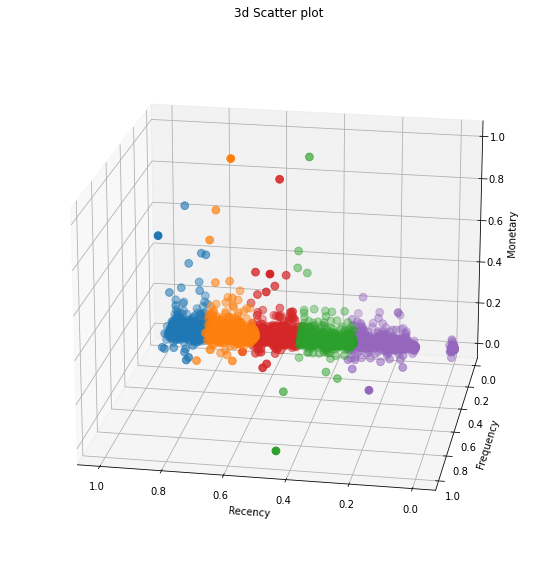

In [21]:
np.random.seed(5)
names = ['Recency', 'Frequency', 'Monetary']
plt.figure(figsize=(20,10))
ax = plt.axes(projection='3d')
for i in range(0,n_clus):
    ax.scatter3D(rfm_model[pred_label==i, 0], rfm_model[pred_label==i, 1], rfm_model[pred_label==i, 2], s= 60)
ax.set_xlabel(names[0])
ax.set_ylabel(names[1])
ax.set_zlabel(names[2])
ax.set_title('3d Scatter plot')
ax.view_init(20,100)
plt.show()

# Predict label 

In [22]:
rfm['Cluster'] = pred_label
rfm_sc['Cluster'] = pred_label

In [23]:
rfm_sc

,Customer Id,Recency,Frequency,Monetary,Cluster
0,9a736b248f67d166d2fbb006bcb877c3,0.445245,1.000000,0.012079,2
1,6fbc7cdadbb522125f4b27ae9dee4060,0.510086,0.500000,0.008882,2
2,f9ae226291893fda10af7965268fb7f6,0.229107,0.459459,0.020706,4
3,569aa12b73b5f7edeaa6f2a01603e381,0.354467,0.337838,0.001173,2
4,85963fd37bfd387aa6d915d8a1065486,0.719020,0.310811,0.038661,1
...,...,...,...,...,...
93335,5ba6b74fb0741b0f6add7f5a5f7d61b6,0.991354,0.000000,0.001990,0
93336,5ba6756bffba1fe9727a104af43cf3e9,0.958213,0.000000,0.002995,0
93337,5ba572c778c07ea0ce0acc8bdda8d263,0.966859,0.000000,0.001395,0
93338,5ba545232dc83d378e08162493ce08b1,0.806916,0.000000,0.000196,1


# Charateristics of each clusters

In [24]:
cluster = rfm_sc.groupby('Cluster')['Customer Id'].count().reset_index().rename(columns ={'Customer Id': 'Number Customer'})
cluster

,Cluster,Number Customer
0,0,19966
1,1,24926
2,2,15229
3,3,22268
4,4,10951


In [25]:
cluster['Recency'] = centroids[:, 0]
cluster['Frequency'] = centroids[:, 1]
cluster['Monetary'] = centroids[:, 2]

# Conducting AHP Method

In [26]:
n = 3
pairwise_matrix = np.ones([n,n])
for i in range(0,n):
    for j in range(0,n):
        if i<j:
            aij = input('How important is option {} over option {} ?: '.format(i,j))    
            if aij.isdigit():
                aij_float = float(aij)
            else:
                if '/' in aij:
                    numerator, denominator = aij.split('/')
                    aij_float = float(numerator) / float(denominator)
                else:
                    aij_float = float(aij)
            pairwise_matrix[i,j] = aij_float
            pairwise_matrix[j,i] = 1/aij_float
pairwise_matrix

array([[1.        , 1.5       , 3.        ],
       [0.66666667, 1.        , 1.33333333],
       [0.33333333, 0.75      , 1.        ]])

In [27]:
normalized_pairwise_matrix = pairwise_matrix.copy()
for j in range(n):
    normalized_pairwise_matrix[:,j] /= sum(pairwise_matrix[:,j])
normalized_pairwise_matrix

array([[0.5       , 0.46153846, 0.5625    ],
       [0.33333333, 0.30769231, 0.25      ],
       [0.16666667, 0.23076923, 0.1875    ]])

In [28]:
# for i in range(0,n):
#     for j in range(0,n):
#         pairwise_matrix[i,j] = pairwise_matrix[i,j] / sum(pairwise_matrix[:,j])
# pairwise_matrix

In [29]:
weight = np.mean(normalized_pairwise_matrix, axis = 1)
weight

array([0.50801282, 0.29700855, 0.19497863])

In [30]:
cluster['Recency * Wr'] = cluster['Recency'] * weight[0]
cluster['Frequency * Wf'] = cluster['Frequency'] * weight[1]
cluster['Monetary * Wm'] = cluster['Monetary'] * weight[2]

In [31]:
cluster['CLV'] = cluster['Recency'] * weight[0] + cluster['Frequency'] * weight[1] + cluster['Monetary'] * weight[2]
cluster['Ranking CLV'] = cluster['CLV'].rank(ascending = False).astype(int)
cluster.sort_values('Cluster').reset_index(drop= True)

,Cluster,Number Customer,Recency,Frequency,Monetary,Recency * Wr,Frequency * Wf,Monetary * Wm,CLV,Ranking CLV
0,0,19966,0.932858,0.002834,0.004253,0.473904,0.000842,0.000829,0.475575,1
1,1,24926,0.777129,0.002852,0.004203,0.394792,0.000847,0.000820,0.396458,2
2,2,15229,0.447360,0.002911,0.004117,0.227265,0.000864,0.000803,0.228932,4
3,3,22268,0.619802,0.002826,0.004085,0.314867,0.000839,0.000797,0.316503,3
4,4,10951,0.257553,0.002910,0.004220,0.130840,0.000864,0.000823,0.132527,5


# Recency

<AxesSubplot:xlabel='Cluster', ylabel='Recency'>

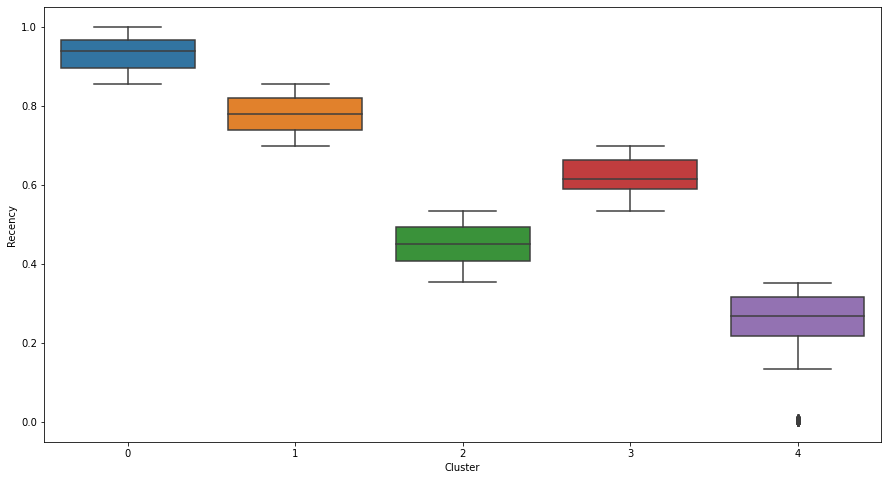

In [32]:
np.random.seed(5)
plt.figure(figsize=(15,8))
sns.boxplot(x = 'Cluster', y = 'Recency', data = rfm_sc)

<AxesSubplot:xlabel='Cluster', ylabel='Frequency'>

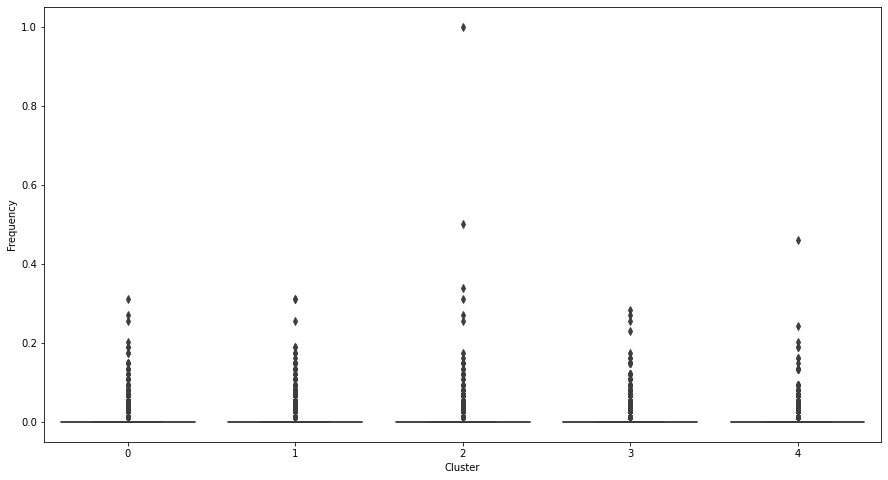

In [33]:
plt.figure(figsize=(15,8))
sns.boxplot(x = 'Cluster', y = 'Frequency', data = rfm_sc)

# Monetary

<AxesSubplot:xlabel='Cluster', ylabel='Monetary'>

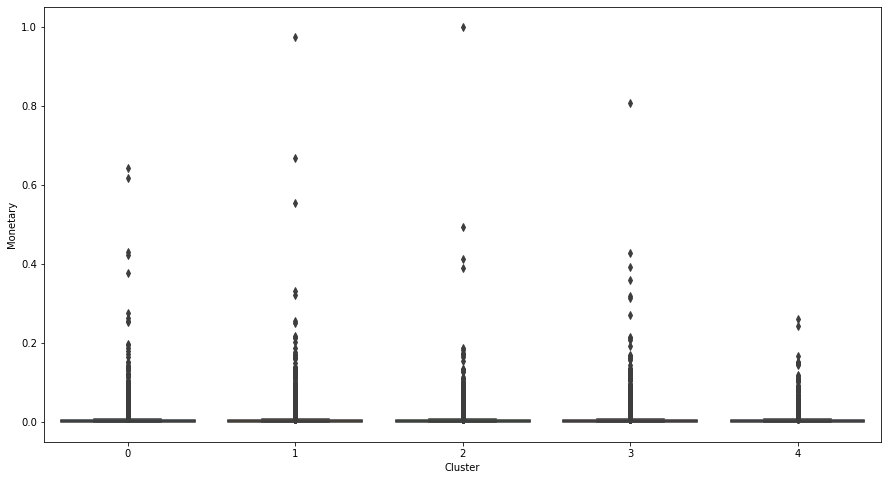

In [34]:
plt.figure(figsize=(15,8))
sns.boxplot(x = 'Cluster', y = 'Monetary', data = rfm_sc)

Cụm 0: Big Spender 
Cụm 1: Promising
Cụm 2: Need Attention
Cụm 3: Loyal Customer
Cụm 4: Can't lose them

In [35]:
df_cluster = df\
.merge(rfm_sc, left_on = 'customer_unique_id', right_on ='Customer Id', how = 'inner')
df_cluster


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,shipping_cost,customer_id,order_status,order_purchase_timestamp,...,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,Diff,Customer Id,Recency,Frequency,Monetary,Cluster
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,9/19/2017 9:45,58.90,13.29,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:00,...,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,350 days 06:01:00,871766c5855e863f6eccc05f988b23cb,0.495677,0.000000,0.001384,2
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,5/3/2017 11:05,239.90,19.93,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:00,...,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,SP,490 days 04:07:00,eb28e67c4c0b83846050ddfb8a35d051,0.504323,0.013514,0.006077,2
2,c105be01f21c9df6a2579f59b95cbcd9,1,d2f5484cbffe4ca766301b21ab9246dd,36a968b544695394e4e9d7572688598f,9/22/2017 16:27,12.88,11.85,02288a47f696f3054b9ef1d5f8e73973,delivered,2017-09-18 16:12:00,...,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,SP,344 days 22:48:00,eb28e67c4c0b83846050ddfb8a35d051,0.504323,0.013514,0.006077,2
3,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,1/18/2018 14:48,199.00,17.87,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:00,...,3818d81c6709e39d06b2738a8d3a2474,35661,para de minas,MG,227 days 00:27:00,3818d81c6709e39d06b2738a8d3a2474,0.672911,0.000000,0.004581,3
4,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,8/15/2018 10:10,12.99,12.79,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:00,...,af861d436cfc08b2c2ddefd0ba074622,12952,atibaia,SP,21 days 05:00:00,af861d436cfc08b2c2ddefd0ba074622,0.969741,0.000000,0.000358,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115005,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,5/2/2018 4:11,299.99,43.41,b51593916b4b8e0d6f66f2ae24f2673d,delivered,2018-04-23 13:57:00,...,0c9aeda10a71f369396d0c04dce13a64,65077,sao luis,MA,128 days 01:03:00,0c9aeda10a71f369396d0c04dce13a64,0.815562,0.000000,0.007378,1
115006,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,7/20/2018 4:31,350.00,36.53,84c5d4fbaf120aae381fad077416eaa0,delivered,2018-07-14 10:26:00,...,0da9fe112eae0c74d3ba1fe16de0988b,81690,curitiba,PR,46 days 04:34:00,0da9fe112eae0c74d3ba1fe16de0988b,0.933718,0.000000,0.008331,0
115007,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,10/30/2017 17:14,99.90,16.95,29309aa813182aaddc9b259e31b870e6,delivered,2017-10-23 17:07:00,...,cd79b407828f02fdbba457111c38e4c4,4039,sao paulo,SP,309 days 21:53:00,cd79b407828f02fdbba457111c38e4c4,0.554755,0.000000,0.002371,3
115008,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,8/21/2017 0:04,55.99,8.72,b5e6afd5a41800fdf401e0272ca74655,delivered,2017-08-14 23:02:00,...,eb803377c9315b564bdedad672039306,13289,vinhedo,SP,379 days 15:58:00,eb803377c9315b564bdedad672039306,0.453890,0.000000,0.001218,2


In [36]:
df_cluster.columns

Index(['order_id', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'shipping_cost', 'customer_id',
       'order_status', 'order_purchase_timestamp', 'order_approved_at',
       'order_delivered_carrier_date', 'order_delivered_customer_date',
       'order_estimated_delivery_date', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value', 'customer_unique_id',
       'customer_zip_code_prefix', 'customer_city', 'customer_state', 'Diff',
       'Customer Id', 'Recency', 'Frequency', 'Monetary', 'Cluster'],
      dtype='object')

In [37]:
# df_cluster.to_csv('D:/HOC KI 6/4. Cap/out.csv')

In [38]:
import plotly.express as px
ft=[ 'payment_value', 'payment_installments']
for i in ft:
    fig = px.box(df_cluster, x="Cluster", y=i)
    fig.show()

In [39]:
ft=['Recency', 'Frequency', 'Monetary']
for i in ft:
    fig = px.box(df_cluster,x="Cluster", y=i)
    fig.show()

In [40]:
# import plotly.express as px
# ft=[ 'Recency','Frequency', 'Monetary']
# for i in ft:
#     fig = sns.box(df_cluster,x="Cluster", y=i, points="all")
#     fig.show()

In [41]:
cluster.sort_values('Cluster').reset_index(drop= True)

,Cluster,Number Customer,Recency,Frequency,Monetary,Recency * Wr,Frequency * Wf,Monetary * Wm,CLV,Ranking CLV
0,0,19966,0.932858,0.002834,0.004253,0.473904,0.000842,0.000829,0.475575,1
1,1,24926,0.777129,0.002852,0.004203,0.394792,0.000847,0.000820,0.396458,2
2,2,15229,0.447360,0.002911,0.004117,0.227265,0.000864,0.000803,0.228932,4
3,3,22268,0.619802,0.002826,0.004085,0.314867,0.000839,0.000797,0.316503,3
4,4,10951,0.257553,0.002910,0.004220,0.130840,0.000864,0.000823,0.132527,5


Cụm 0: Champions
Cụm 1: Promising
Cụm 2: Need Attention
Cụm 3: Recent Customers
Cụm 4: At Risk

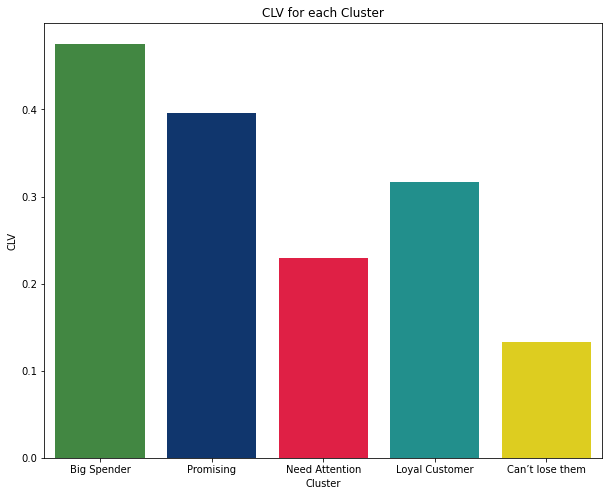

In [42]:
plt.figure(figsize = (10,8))
ax = sns.barplot(data = cluster, x = 'Cluster', y = 'CLV', palette = ['#379237', '#00337C', '#FF0032', '#10A19D', '#FCE700'])
ax.set_xticklabels(['Big Spender', 'Promising', 'Need Attention', 'Loyal Customer', 'Can’t lose them'])
ax.set_xlabel('Cluster')
ax.set_ylabel('CLV')
ax.set_title('CLV for each Cluster')
plt.show()

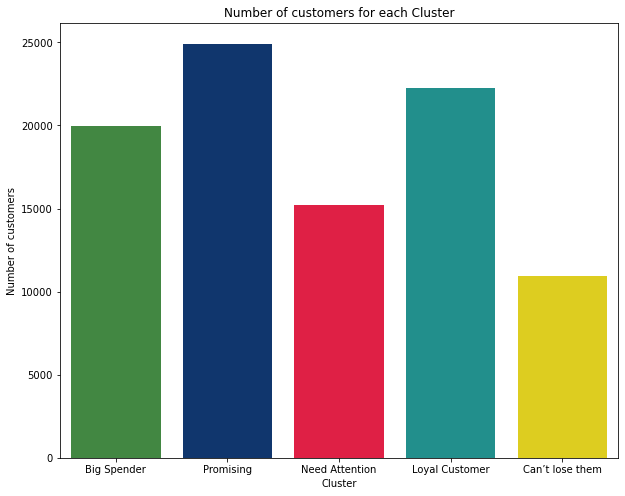

In [43]:
plt.figure(figsize = (10,8))
ax = sns.barplot(data = cluster, x = 'Cluster', y = 'Number Customer', palette = ['#379237', '#00337C', '#FF0032', '#10A19D', '#FCE700'])
ax.set_xticklabels(['Big Spender', 'Promising', 'Need Attention', 'Loyal Customer', 'Can’t lose them'])
ax.set_xlabel('Cluster')
ax.set_ylabel('Number of customers')
ax.set_title('Number of customers for each Cluster')
plt.show()

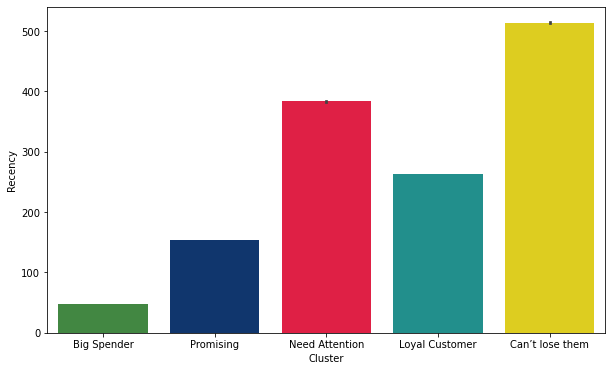

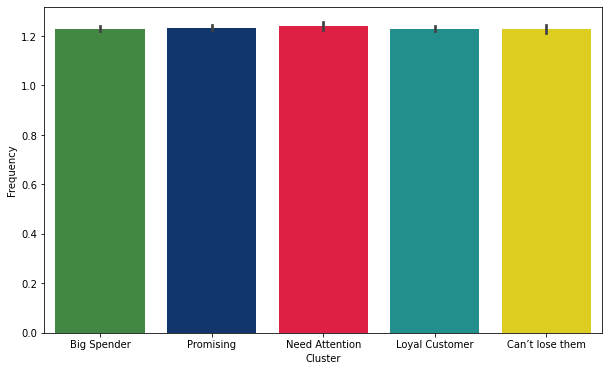

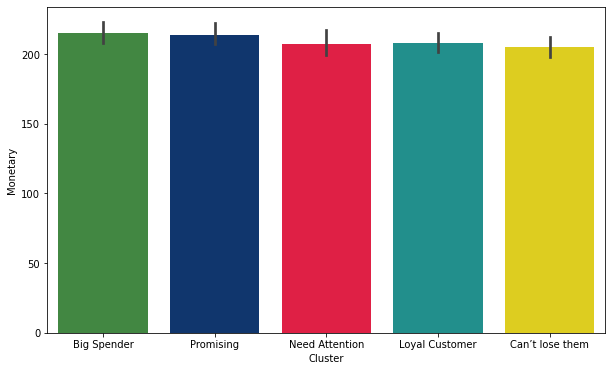

In [44]:
ft=['Recency', 'Frequency', 'Monetary']
for i in ft:
    plt.figure(figsize = (10,6))
    ax = sns.barplot(data = rfm, x = 'Cluster', y = i, palette = ['#379237', '#00337C', '#FF0032', '#10A19D', '#FCE700'])
    ax.set_xticklabels(['Big Spender', 'Promising', 'Need Attention', 'Loyal Customer', 'Can’t lose them'])
    plt.show()